# Testing examples from hydroclimatology

In [48]:
# # this block is for developing the module, comment out when using the module, and uncomment import easysnowdata
# %load_ext autoreload
# %autoreload 2
# %aimport easysnowdata

In [64]:
!pip install easysnowdata geopandas xarray contextily earthengine-api
!pip install pygeohydro

In [65]:
import easysnowdata
import geopandas as gpd
import xarray as xr
#from easysnowdata.utils import convert_bbox_to_geodataframe
import json
import ee
import matplotlib.pyplot as plt
import numpy as np
import contextily as ctx
import rioxarray as rxr
import pandas as pd
import geopandas as gpd
from pygeohydro import WBD

In [49]:
# import ee
# ee.Authenticate()
# ee.Initialize()

In [47]:
# ee.Authenticate()
# # ee.Initialize(project='YOUR_PROJECT_ID',opt_url="https://earthengine-highvolume.googleapis.com") # Replace 'YOUR_PROJECT_ID' with your actual Google Cloud Project ID


# ee.Initialize(project='egagli-data-access',opt_url="https://earthengine-highvolume.googleapis.com")

In [13]:
bbox_gdf = gpd.read_file(
    "https://github.com/egagli/easysnowdata/raw/main/docs/examples/mt_rainier.geojson"
)

In [44]:
def get_huc_geometries_local(huc_level, geom_gdf):
    """
    Fetch HUC geometries locally using USGS WBD via pygeohydro.

    Parameters
    ----------
    huc_level : str or int
        HUC level ('02','04','06','08','10','12' or 2,4,6,8,10,12)
    geom_gdf : geopandas.GeoDataFrame
        GeoDataFrame containing geometry (e.g., bbox or AOI)

    Returns
    -------
    geopandas.GeoDataFrame
        HUC geometries intersecting the input geometry
    """

    # Normalize HUC level
    huc_level = f"huc{int(huc_level)}"

    # Initialize WBD
    wbd = WBD(huc_level)

    # Extract shapely geometry (first feature)
    geom = geom_gdf.geometry.iloc[0]

    # Fetch HUCs intersecting geometry
    huc_gdf = wbd.bygeom(geom)

    return huc_gdf

In [57]:
bbox_gdf = gpd.read_file(
    "https://github.com/egagli/easysnowdata/raw/main/docs/examples/mt_rainier.geojson"
)

huc02_gdf = get_huc_geometries_local("02", bbox_gdf)
huc02_gdf.head()

,geometry,objectid,tnmid,metasourceid,sourcedatadesc,sourceoriginator,sourcefeatureid,loaddate,referencegnis_ids,areaacres,areasqkm,states,huc2,name,globalid,shape_Length,shape_Area
0,"POLYGON ((-118.98122 52.87766, -118.98143 52.8...",16,{31AE82B1-B1F0-4839-A09B-1836570B4D37},{A9DB8B60-5A4A-4FFC-8BE7-FA64FC77FE78},Pierce 2020,"Pierce County Washington, Washington State Dep...",None,1734859392000,None,206707624.1,836516.82,"CA,CN,ID,MT,NV,OR,UT,WA,WY",17,Pacific Northwest Region,{CC10761E-7019-491A-9AF2-CA17FCA9967D},1.239868e+07,1.742310e+12


## [Koppen Geiger Climate Classification](https://figshare.com/articles/dataset/High-resolution_1_km_K_ppen-Geiger_maps_for_1901_2099_based_on_constrained_CMIP6_projections/21789074/1?file=45057352)

In [38]:
koppen_geiger_da = easysnowdata.hydroclimatology.get_koppen_geiger_classes(resolution="0.1 degree")
#koppen_geiger_da

No spatial subsetting because bbox_input was not provided.


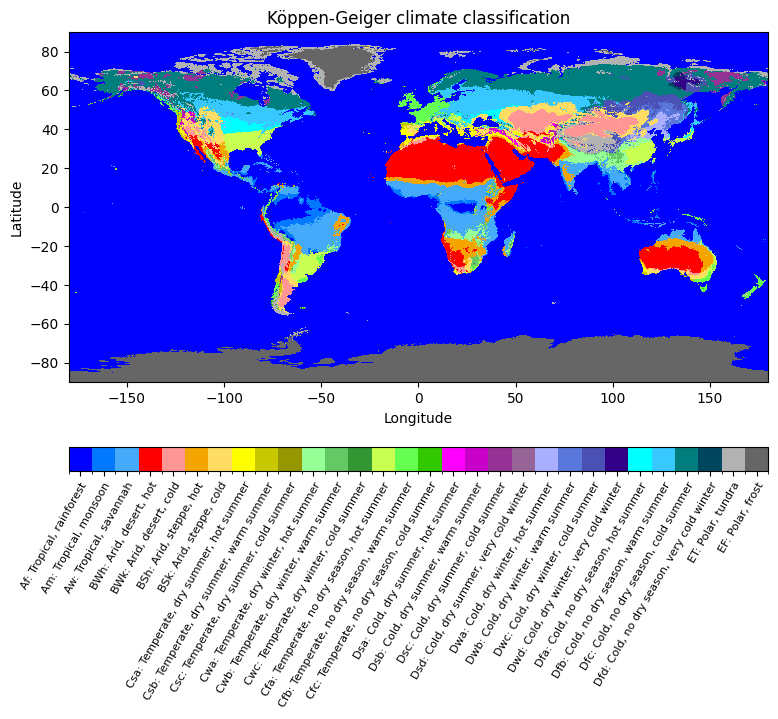

In [39]:
f,ax = koppen_geiger_da.attrs['example_plot'](koppen_geiger_da)

In [40]:
koppen_geiger_da = easysnowdata.hydroclimatology.get_koppen_geiger_classes(bbox_input=bbox_gdf,resolution="1 km")
#koppen_geiger_da

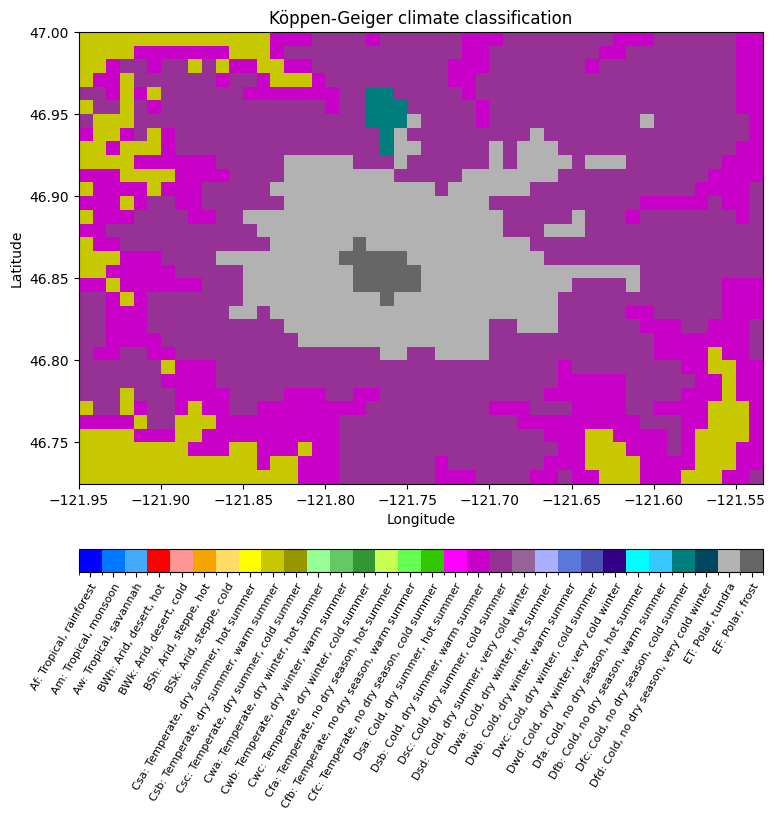

In [41]:
f,ax = koppen_geiger_da.attrs['example_plot'](koppen_geiger_da)

## [HUC02 geometries](https://developers.google.com/earth-engine/datasets/catalog/USGS_WBD_2017_HUC02)

This might take a moment...

In [53]:
# huc02_gdf = easysnowdata.hydroclimatology.get_huc_geometries(huc_level="02")

In [58]:
# huc02_gdf.explore()

huc02_gdf.explore()

### Get HUC geometries given a bounding box

In [60]:
# huc02_gdf = easysnowdata.hydroclimatology.get_huc_geometries(
#     bbox_input=bbox_gdf, huc_level="02"
# )
# huc04_gdf = easysnowdata.hydroclimatology.get_huc_geometries(
#     bbox_input=bbox_gdf, huc_level="04"
# )
# huc06_gdf = easysnowdata.hydroclimatology.get_huc_geometries(
#     bbox_input=bbox_gdf, huc_level="06"
# )
# huc08_gdf = easysnowdata.hydroclimatology.get_huc_geometries(
#     bbox_input=bbox_gdf, huc_level="08"
# )
# huc10_gdf = easysnowdata.hydroclimatology.get_huc_geometries(
#     bbox_input=bbox_gdf, huc_level="10"
# )
# huc12_gdf = easysnowdata.hydroclimatology.get_huc_geometries(
#     bbox_input=bbox_gdf, huc_level="12"
# )


# Using the local pygeohydro-based function

huc02_gdf = get_huc_geometries_local("02", bbox_gdf)
huc04_gdf = get_huc_geometries_local("04", bbox_gdf)
huc06_gdf = get_huc_geometries_local("06", bbox_gdf)
huc08_gdf = get_huc_geometries_local("08", bbox_gdf)
huc10_gdf = get_huc_geometries_local("10", bbox_gdf)
huc12_gdf = get_huc_geometries_local("12", bbox_gdf)

Text(0.5, 0.98, 'HUC geometries')

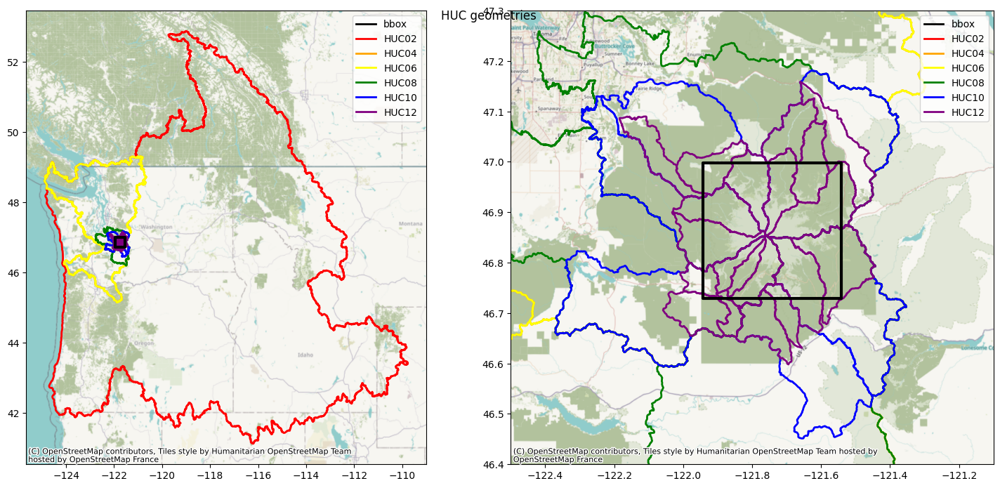

In [61]:
f, axs = plt.subplots(1, 2, figsize=(15, 7))

for ax in axs:
    huc02_gdf.plot(ax=ax, color="none", edgecolor="red", linewidth=2, label="HUC02")
    huc04_gdf.plot(ax=ax, color="none", edgecolor="orange", linewidth=2, label="HUC04")
    huc06_gdf.plot(ax=ax, color="none", edgecolor="yellow", linewidth=2, label="HUC06")
    huc08_gdf.plot(ax=ax, color="none", edgecolor="green", linewidth=2, label="HUC08")
    huc10_gdf.plot(ax=ax, color="none", edgecolor="blue", linewidth=2, label="HUC10")
    huc12_gdf.plot(ax=ax, color="none", edgecolor="purple", linewidth=2, label="HUC12")
    bbox_gdf.plot(ax=ax, color="none", edgecolor="black", linewidth=3, label="bbox")

ctx.add_basemap(axs[0], crs=huc02_gdf.crs)

axs[1].set_xlim(-122.5, -121.1)
axs[1].set_ylim(46.4, 47.3)
ctx.add_basemap(axs[1], crs=huc02_gdf.crs)


# Create a legend for the HUC levels
from matplotlib.lines import Line2D

legend_elements = [
    Line2D([0], [0], color="black", lw=2, label="bbox"),
    Line2D([0], [0], color="red", lw=2, label="HUC02"),
    Line2D([0], [0], color="orange", lw=2, label="HUC04"),
    Line2D([0], [0], color="yellow", lw=2, label="HUC06"),
    Line2D([0], [0], color="green", lw=2, label="HUC08"),
    Line2D([0], [0], color="blue", lw=2, label="HUC10"),
    Line2D([0], [0], color="purple", lw=2, label="HUC12"),
]
for ax in axs:
    ax.legend(handles=legend_elements)

f.tight_layout()
f.suptitle("HUC geometries")

## [HydroBASINS geometries](https://www.hydrosheds.org/products/hydrobasins)

In [62]:
hydroATLAS_level5_gdf = easysnowdata.hydroclimatology.get_hydroBASINS(bbox_input=bbox_gdf, level=5)
hydroATLAS_level5_gdf

Getting geometries for Africa...
Africa takes a bit longer because we have to temporarily save the file due to read issue...
Getting geometries for Arctic...
Getting geometries for Asia...
Getting geometries for Australia...
Getting geometries for Europe...
Getting geometries for Greenland...
Getting geometries for North America...
Getting geometries for South America...
Getting geometries for Siberia...


,HYBAS_ID,NEXT_DOWN,NEXT_SINK,MAIN_BAS,DIST_SINK,DIST_MAIN,SUB_AREA,UP_AREA,PFAF_ID,ENDO,COAST,ORDER,SORT,geometry
108,7050014930,0,7050014930,7050014930,0.0,0.0,12236.9,651407.2,78210,0,0,1,109,"POLYGON ((-121.77864 46.73141, -121.77553 46.7..."
133,7050014940,0,7050014940,7050014940,0.0,0.0,52968.8,52968.8,78310,0,1,0,134,"POLYGON ((-121.54658 46.8661, -121.55196 46.87..."


/tmp/ipython-input-1465880548.py:2: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  hydroATLAS_level5_gdf.plot(ax=ax, column='HYBAS_ID', color='none', edgecolor='red', linewidth=2)
/tmp/ipython-input-1465880548.py:6: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()
/tmp/ipython-input-1465880548.py:6: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


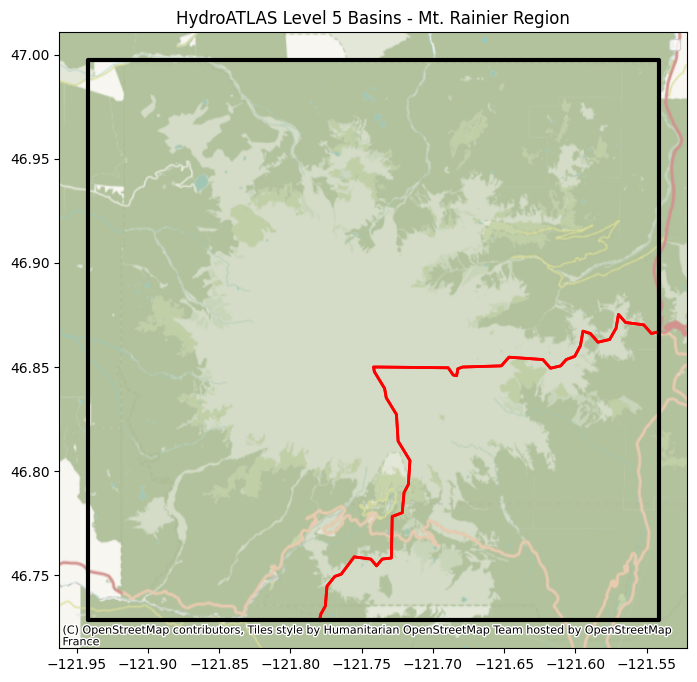

In [63]:
f, ax = plt.subplots(figsize=(12, 8))
hydroATLAS_level5_gdf.plot(ax=ax, column='HYBAS_ID', color='none', edgecolor='red', linewidth=2)
bbox_gdf.plot(ax=ax, color='none', edgecolor='black', linewidth=3, label='bbox')
ctx.add_basemap(ax, crs=hydroATLAS_level5_gdf.crs)
ax.set_title('HydroATLAS Level 5 Basins - Mt. Rainier Region')
ax.legend()

Loading HydroATLAS level 3 basins...


/home/eric/miniconda3/envs/easysnowdata/lib/python3.10/site-packages/geopandas/io/file.py:497: UserWarning: More than one layer found in 'BasinATLAS_Data_v10.gdb.zip': 'BasinATLAS_v10_lev01' (default), 'BasinATLAS_v10_lev02', 'BasinATLAS_v10_lev03', 'BasinATLAS_v10_lev04', 'BasinATLAS_v10_lev05', 'BasinATLAS_v10_lev06', 'BasinATLAS_v10_lev07', 'BasinATLAS_v10_lev08', 'BasinATLAS_v10_lev09', 'BasinATLAS_v10_lev10', 'BasinATLAS_v10_lev11', 'BasinATLAS_v10_lev12'. Specify layer parameter to avoid this warning.
  crs = pyogrio.read_info(path_or_bytes).get("crs")


Loading HydroATLAS level 7 basins...


/home/eric/miniconda3/envs/easysnowdata/lib/python3.10/site-packages/geopandas/io/file.py:497: UserWarning: More than one layer found in 'BasinATLAS_Data_v10.gdb.zip': 'BasinATLAS_v10_lev01' (default), 'BasinATLAS_v10_lev02', 'BasinATLAS_v10_lev03', 'BasinATLAS_v10_lev04', 'BasinATLAS_v10_lev05', 'BasinATLAS_v10_lev06', 'BasinATLAS_v10_lev07', 'BasinATLAS_v10_lev08', 'BasinATLAS_v10_lev09', 'BasinATLAS_v10_lev10', 'BasinATLAS_v10_lev11', 'BasinATLAS_v10_lev12'. Specify layer parameter to avoid this warning.
  crs = pyogrio.read_info(path_or_bytes).get("crs")


Text(0.5, 0.98, 'HydroATLAS Basin Hierarchy - Mt. Rainier Region')

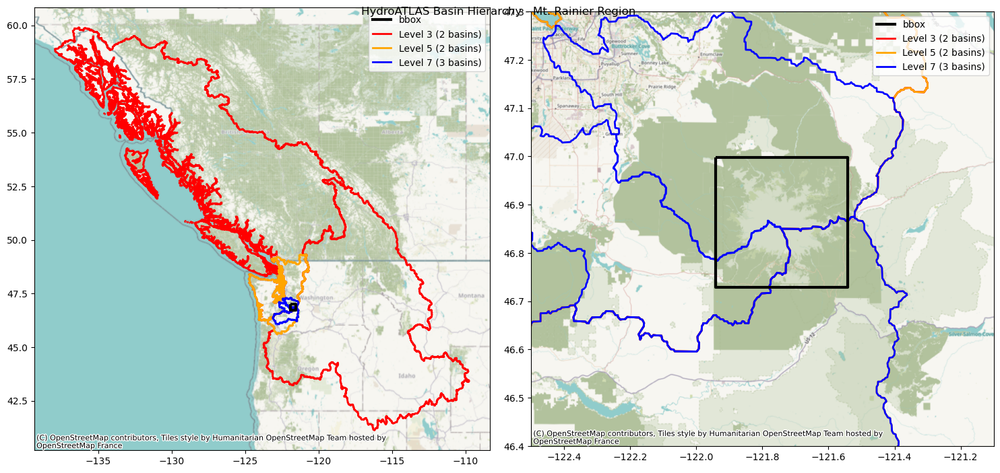

In [ ]:
hydroATLAS_level3_gdf = easysnowdata.hydroclimatology.get_hydroBASINS(bbox_input=bbox_gdf, level=3)
hydroATLAS_level7_gdf = easysnowdata.hydroclimatology.get_hydroBASINS(bbox_input=bbox_gdf, level=7)

f, axs = plt.subplots(1, 2, figsize=(15, 7))

for ax in axs:
    hydroATLAS_level3_gdf.plot(ax=ax, color="none", edgecolor="red", linewidth=2, label="Level 3")
    hydroATLAS_level5_gdf.plot(ax=ax, color="none", edgecolor="orange", linewidth=2, label="Level 5")
    hydroATLAS_level7_gdf.plot(ax=ax, color="none", edgecolor="blue", linewidth=2, label="Level 7")
    bbox_gdf.plot(ax=ax, color="none", edgecolor="black", linewidth=3, label="bbox")

ctx.add_basemap(axs[0], crs=hydroATLAS_level5_gdf.crs)

axs[1].set_xlim(-122.5, -121.1)
axs[1].set_ylim(46.4, 47.3)
ctx.add_basemap(axs[1], crs=hydroATLAS_level5_gdf.crs)

# Create a legend for the HydroATLAS levels
from matplotlib.lines import Line2D

legend_elements = [
    Line2D([0], [0], color="black", lw=3, label="bbox"),
    Line2D([0], [0], color="red", lw=2, label=f"Level 3 ({len(hydroATLAS_level3_gdf)} basins)"),
    Line2D([0], [0], color="orange", lw=2, label=f"Level 5 ({len(hydroATLAS_level5_gdf)} basins)"),
    Line2D([0], [0], color="blue", lw=2, label=f"Level 7 ({len(hydroATLAS_level7_gdf)} basins)"),
]
for ax in axs:
    ax.legend(handles=legend_elements)

f.tight_layout()
f.suptitle("HydroATLAS Basin Hierarchy - Mt. Rainier Region")

## [GDRC Major River Basins of the World](https://grdc.bafg.de/products/basin_layers/major_rivers/)

In [ ]:
grdc_basins_gdf = easysnowdata.hydroclimatology.get_grdc_major_river_basins_of_the_world()

No spatial subsetting because bbox_input was not provided.


Text(0.5, 1.0, 'GRDC Major River Basins of the World')

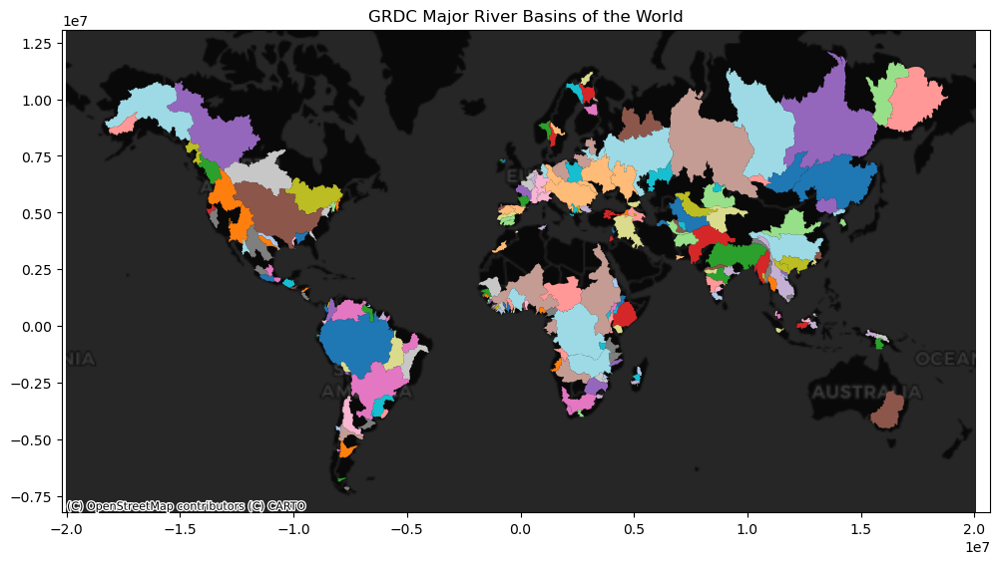

In [ ]:
f, ax = plt.subplots(figsize=(12, 7))
grdc_basins_gdf.to_crs(epsg=3857).plot(ax=ax, column='NAME',cmap='tab20')
ctx.add_basemap(ax, source=ctx.providers.CartoDB.DarkMatter)
ax.set_title("GRDC Major River Basins of the World")

## [GRDC WMO Basins and Sub-Basins](https://grdc.bafg.de/products/basin_layers/wmo_basins/)

In [ ]:
wmo_basins_gdf = easysnowdata.hydroclimatology.get_grdc_wmo_basins()
#wmo_basins_gdf

No spatial subsetting because bbox_input was not provided.


Text(0.5, 1.0, 'GRDC WMO Basins and Sub-basins')

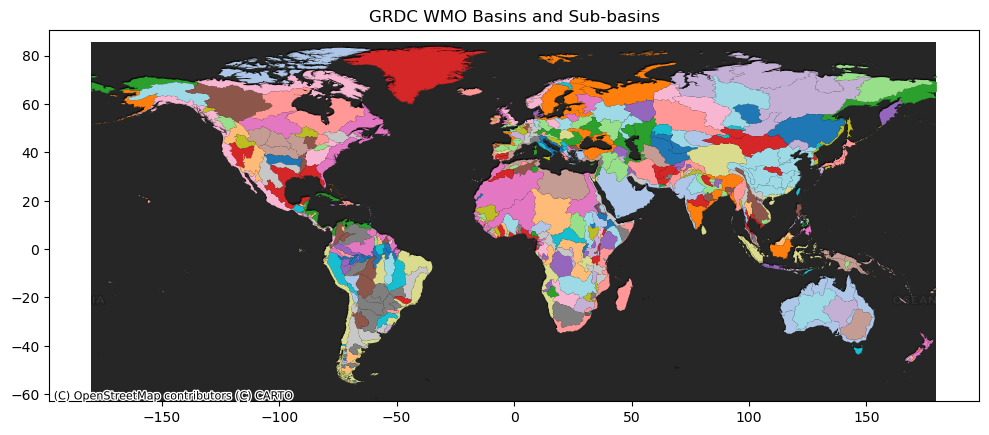

In [ ]:
f, ax = plt.subplots(figsize=(12, 7))
wmo_basins_gdf.plot(ax=ax, column='WMOBB_NAME',cmap='tab20')
ctx.add_basemap(ax, crs=wmo_basins_gdf.crs,source=ctx.providers.CartoDB.DarkMatter)
ax.set_title("GRDC WMO Basins and Sub-basins")

## [ERA5 hourly atmospheric reanalysis on google cloud storage](https://cloud.google.com/storage/docs/public-datasets/era5)

In [ ]:
era5_global_ds = easysnowdata.hydroclimatology.get_era5(version="ERA5",cadence="HOURLY")
era5_global_ds

<xarray.Dataset> Size: 2PB
Dimensions:                                                          (
                                                                      time: 744384,
                                                                      latitude: 721,
                                                                      longitude: 1440,
                                                                      level: 37)
Coordinates:
  * latitude                                                         (latitude) float32 3kB ...
  * level                                                            (level) int64 296B ...
  * time                                                             (time) datetime64[ns] 6MB ...
    spatial_ref                                                      int64 8B 0
  * longitude                                                        (longitude) float32 6kB ...
Data variables: (12/273)
    100m_u_component_of_wind                                         (time, latitude, longitude) float32 3TB ...
    100m_v_component_of_wind                                         (time, latitude, longitude) float32 3TB ...
    10m_u_component_of_neutral_wind                                  (time, latitude, longitude) float32 3TB ...
    10m_u_component_of_wind                                          (time, latitude, longitude) float32 3TB ...
    10m_v_component_of_neutral_wind                                  (time, latitude, longitude) float32 3TB ...
    10m_v_component_of_wind                                          (time, latitude, longitude) float32 3TB ...
    ...                                                               ...
    wave_spectral_directional_width_for_swell                        (time, latitude, longitude) float32 3TB ...
    wave_spectral_directional_width_for_wind_waves                   (time, latitude, longitude) float32 3TB ...
    wave_spectral_kurtosis                                           (time, latitude, longitude) float32 3TB ...
    wave_spectral_peakedness                                         (time, latitude, longitude) float32 3TB ...
    wave_spectral_skewness                                           (time, latitude, longitude) float32 3TB ...
    zero_degree_level                                                (time, latitude, longitude) float32 3TB ...
Attributes:
    valid_time_start:  1940-01-01
    last_updated:      2025-02-23 12:13:20.255008+00:00
    valid_time_stop:   2024-11-30
    data_citation:     Carver, Robert W, and Merose, Alex. (2023): ARCO-ERA5:...
    source:            Google Cloud Storage (ARCO-ERA5)
    version:           ERA5
    cadence:           HOURLY

Text(0.5, 0.98, 'ERA5 2m Temperature on 2020-05-26')

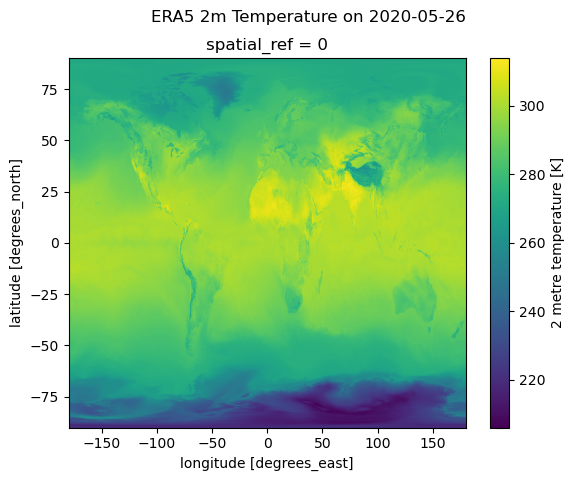

In [ ]:
f, ax = plt.subplots()
era5_global_ds["2m_temperature"].sel(time="2020-05-26").mean(dim="time").plot.imshow(ax=ax)
f.suptitle("ERA5 2m Temperature on 2020-05-26")

## [ERA5 and ERA5-Land atmospheric reanalysis on google earth engine](https://developers.google.com/earth-engine/datasets/catalog/ECMWF_ERA5_LAND_DAILY_AGGR)

In [ ]:
era5_land_ds = easysnowdata.hydroclimatology.get_era5(bbox_input=bbox_gdf,
                                                         version="ERA5_LAND",
                                                        cadence="DAILY",
                                                        start_date="2020-10-01",
                                                        end_date="2021-09-30")
era5_land_ds

<xarray.Dataset> Size: 3MB
Dimensions:                                                    (time: 365,
                                                                longitude: 4,
                                                                latitude: 3)
Coordinates:
  * time                                                       (time) datetime64[ns] 3kB ...
  * longitude                                                  (longitude) float64 32B ...
  * latitude                                                   (latitude) float64 24B ...
Data variables: (12/150)
    dewpoint_temperature_2m                                    (time, latitude, longitude) float32 18kB ...
    temperature_2m                                             (time, latitude, longitude) float32 18kB ...
    skin_temperature                                           (time, latitude, longitude) float32 18kB ...
    soil_temperature_level_1                                   (time, latitude, longitude) float32 18kB ...
    soil_temperature_level_2                                   (time, latitude, longitude) float32 18kB ...
    soil_temperature_level_3                                   (time, latitude, longitude) float32 18kB ...
    ...                                                         ...
    total_precipitation_min                                    (time, latitude, longitude) float32 18kB ...
    total_precipitation_max                                    (time, latitude, longitude) float32 18kB ...
    leaf_area_index_high_vegetation_min                        (time, latitude, longitude) float32 18kB ...
    leaf_area_index_high_vegetation_max                        (time, latitude, longitude) float32 18kB ...
    leaf_area_index_low_vegetation_min                         (time, latitude, longitude) float32 18kB ...
    leaf_area_index_low_vegetation_max                         (time, latitude, longitude) float32 18kB ...
Attributes:
    crs:            EPSG:4326
    data_citation:  Hersbach, H., Bell, B., Berrisford, P., et al. (2020). Th...
    version:        ERA5_LAND
    cadence:        DAILY
    source:         Google Earth Engine

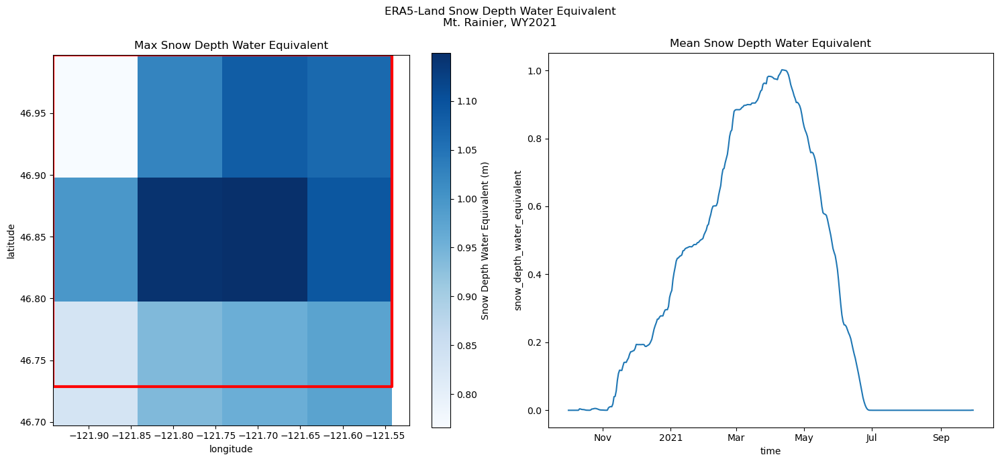

In [ ]:
f,axs=plt.subplots(1,2,figsize=(15,7))

era5_land_ds["snow_depth_water_equivalent"].max(dim="time").plot.imshow(ax=axs[0],cmap='Blues',cbar_kwargs={'label':'Snow Depth Water Equivalent (m)'})
era5_land_ds["snow_depth_water_equivalent"].mean(dim=["latitude","longitude"]).plot(ax=axs[1])
bbox_gdf.plot(ax=axs[0], color="none", edgecolor="red", linewidth=3)

axs[0].set_title("Max Snow Depth Water Equivalent")
axs[1].set_title("Mean Snow Depth Water Equivalent")

f.suptitle("ERA5-Land Snow Depth Water Equivalent\nMt. Rainier, WY2021")
f.tight_layout()

## [UCLA snow reanalysis](https://nsidc.org/data/wus_ucla_sr/versions/1)

In [ ]:
snow_reanalysis_da = easysnowdata.hydroclimatology.get_ucla_snow_reanalysis(
    bbox_gdf,
    start_date="2020-10-01",
    end_date="2021-09-30",
    variable="SWE_Post",
    stats="mean",
)

QUEUEING TASKS | :   0%|          | 0/2 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/2 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/2 [00:00<?, ?it/s]

Text(0.5, 0.98, 'UCLA SWE reanalysis')

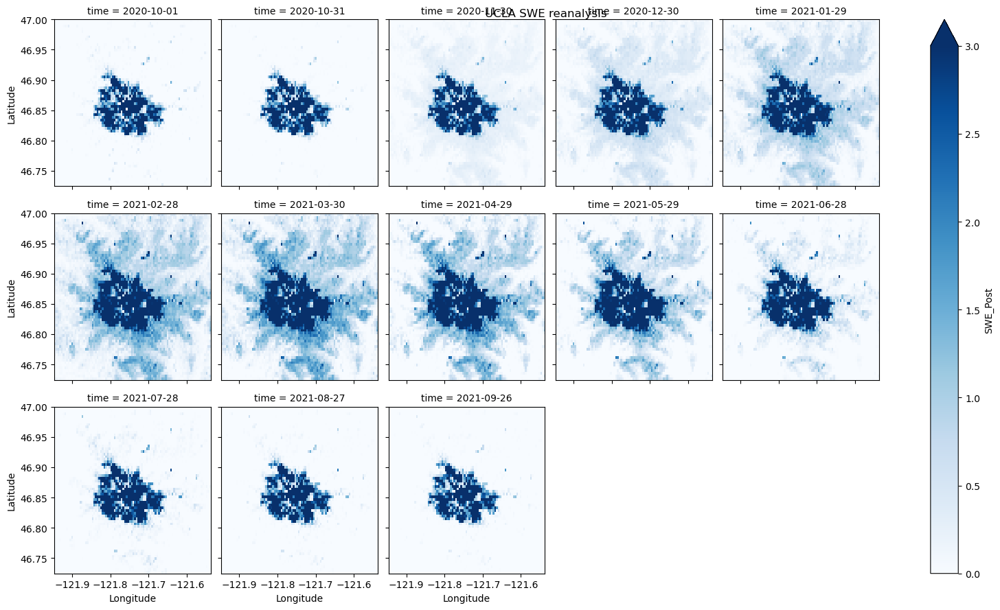

In [ ]:
f = snow_reanalysis_da.isel(time=slice(0, 365, 30)).plot.imshow(
    col="time",
    col_wrap=5,
    cmap="Blues",
    vmin=0,
    vmax=3,
)

f.fig.suptitle("UCLA SWE reanalysis")

## [SNODAS on google earth engine](https://gee-community-catalog.org/projects/snodas)

In [ ]:
snodas_ds = easysnowdata.hydroclimatology.get_snodas(
    bbox_input=bbox_gdf,
    start_date="2020-10-01",
    end_date="2021-09-30",
    variables=["Snow_Depth", "SWE"]
)
snodas_ds

<xarray.Dataset> Size: 4MB
Dimensions:      (time: 365, latitude: 32, longitude: 48)
Coordinates:
  * time         (time) datetime64[ns] 3kB 2020-10-01 2020-10-02 ... 2021-09-30
  * longitude    (longitude) float64 384B -121.9 -121.9 -121.9 ... -121.6 -121.5
  * latitude     (latitude) float64 256B 46.99 46.98 46.98 ... 46.75 46.74 46.73
    spatial_ref  int64 8B 0
Data variables:
    Snow_Depth   (time, latitude, longitude) float32 2MB ...
    SWE          (time, latitude, longitude) float32 2MB ...
Attributes:
    title:                Snow Data Assimilation System (SNODAS)
    institution:          National Operational Hydrologic Remote Sensing Cent...
    source:               Google Earth Engine (Climate Engine Org collection)
    spatial_resolution:   1 km
    temporal_resolution:  Daily
    coverage:             Continental United States, Alaska, and Hawaii
    data_citation:        Barrett, Andrew. 2003. National Operational Hydrolo...
    license:              NOAA data, information, and products, regardless of...

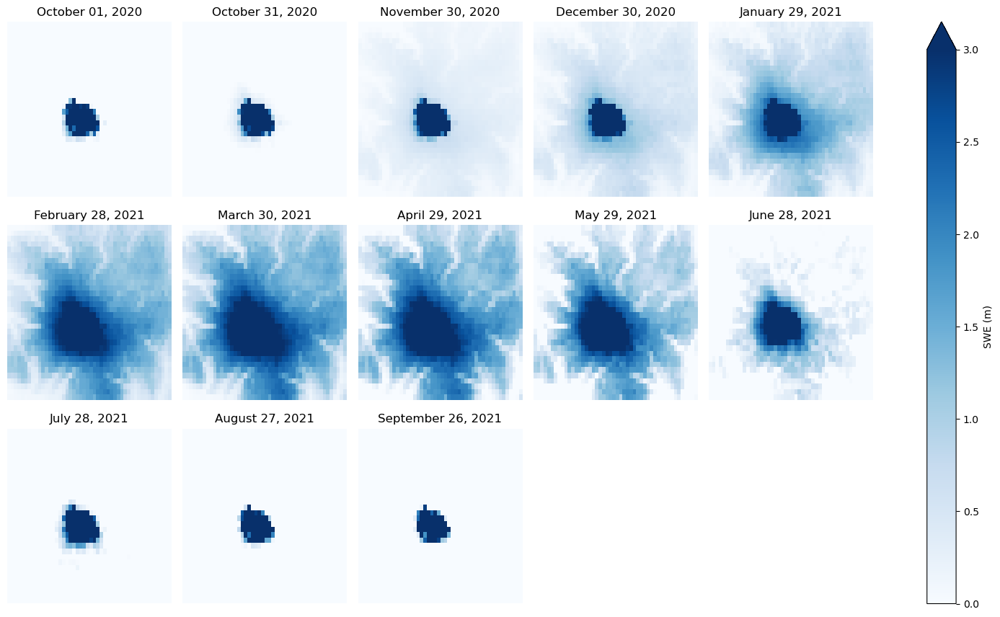

In [ ]:
f = snodas_ds["SWE"].isel(time=slice(0, 365, 30)).plot.imshow(
    col="time",
    col_wrap=5,
    cmap="Blues",
    vmin=0,
    vmax=3,
    cbar_kwargs={'label': 'SWE (m)'}
)

for ax, time in zip(f.axs.flat, snodas_ds["SWE"].isel(time=slice(0, 365, 30)).time.values):
    ax.set_title(f'{pd.to_datetime(time).strftime("%B %d, %Y")}')
    ax.axis('off')